In [51]:
import torch

In [52]:
A = torch.Tensor([1,0,0,0]).reshape(1,4)


In [53]:
B = torch.Tensor([0,0,3,0]).reshape(4,1)


In [54]:
A.T @ A

tensor([[1., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]])

In [55]:
A @ B

tensor([[0.]])

In [56]:
C = B @ A

In [57]:
C.flatten()

tensor([0., 0., 0., 0., 0., 0., 0., 0., 3., 0., 0., 0., 0., 0., 0., 0.])

In [58]:
import numpy as np
import matplotlib.pyplot as plt

def init_grid(size=(20,)) -> torch.Tensor:
    grid = torch.randn(*size)
    grid[grid > 0] = 1
    grid[grid <= 0] = 0
    print(grid)
    grid = grid.byte()
    return grid

def get_reward(s,a:int):
    r = -1
    for i in s:
        if i == a:
            r += 0.9 # ? why 0.9 not 1
    r *= 2
    return r

grid = init_grid((50,))
grid

tensor([0., 0., 1., 1., 0., 1., 1., 1., 0., 1., 0., 1., 1., 0., 0., 1., 0., 0.,
        1., 0., 0., 1., 0., 1., 1., 1., 0., 0., 0., 0., 1., 0., 0., 0., 1., 0.,
        1., 1., 1., 0., 0., 1., 1., 1., 1., 0., 0., 1., 0., 1.])


tensor([0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1,
        1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1,
        0, 1], dtype=torch.uint8)

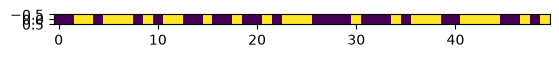

In [59]:
plt.imshow(np.expand_dims(grid,0))

In [60]:
def gen_params(N,size):
    params = []
    for _ in range(N):
        param = torch.randn(size) / 10.
        param.requires_grad = True
        params.append(param)
    return params
    

In [61]:
def qfunc(s,theta,layers=[(4,20),(20,2)],afn=torch.tanh) -> torch.Tensor:
    l1n = layers[0]
    l1s = np.prod(l1n)
    theta_1 = theta[0:l1s].reshape(*l1n)
    l2n = layers[1]
    l2s = np.prod(l2n)
    theta_2 = theta[l1s:l1s+l2s].reshape(*l2n)
    bias = torch.ones((1,l1n[1]))

    # s.shape = 1 * 4
    l1 = s @ theta_1 + bias
    l1 = torch.nn.functional.elu(l1)
    l2 = l1 @ theta_2
    l2 = afn(l2)

    return l2.flatten()

    

In [62]:
def substate(b:int) -> torch.Tensor:
    s = torch.zeros(2)
    if b > 0:
        s[1] = 1
    else:
        s[0] = 1
    return s

def joint_state(s:list) -> torch.Tensor: 
    """s is neighbors action list [0,1]:
        left action is 0, right action is 1"""
    
    s1_ = substate(s[0])
    s2_ = substate(s[1])
    ret = s1_.reshape(2,1) @ s2_.reshape(1,2)
    return ret.flatten()

tensor([1., 0., 1., 0., 1., 0., 1., 1., 0., 0., 1., 0., 1., 1., 1., 1., 1., 1.,
        1., 0.])
tensor([1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0],
       dtype=torch.uint8)


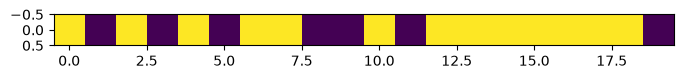

In [63]:
plt.figure(figsize=(8,5)) 
size = (20,) 
hid_layer = 20 
# params = gen_params(size[0],4*hid_layer+hid_layer*2) 
grid = init_grid(size=size) 
grid_ = grid.clone() 
print(grid) 
plt.imshow(np.expand_dims(grid,0))

In [64]:
epochs = 520
layers=[(4,20),(20,2)]
tot_params = np.prod(layers[0])+np.prod(layers[1])
size = (20,)
lr = 0.001
losses = [[] for _ in range(size[0])]
params = gen_params(size[0],tot_params)
for i in range(epochs):
    for j in range(size[0]):
        l = j-1
        r = j+1 if j+1 < size[0] else 0
        s_ = torch.stack((grid[l],grid[r]),dim=0)
        s = joint_state(s_)
        q_val = qfunc(s.float().detach(),params[j],layers)
        action = int(torch.argmax(q_val))
        grid_[j] = action
        reward = get_reward(s_.detach(),action)
        with torch.no_grad():  
            target = q_val.clone() 
            target[action] = reward
        loss = torch.sum(torch.pow(q_val - target,2)) 
        losses[j].append(loss.detach().numpy()) 
        loss.backward() 
        with torch.no_grad():  
            params[j] = params[j] - lr * params[j].grad
        params[j].requires_grad = True 
    with torch.no_grad():  
        grid = grid_.clone()


tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0],
       dtype=torch.uint8) tensor(5)


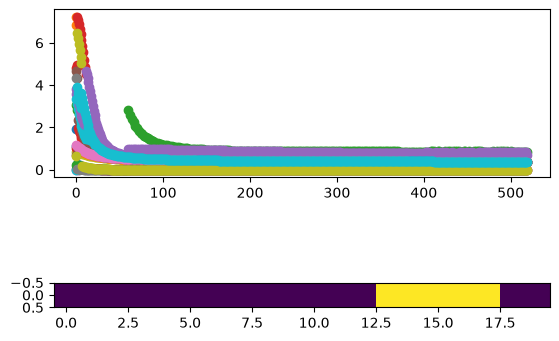

In [65]:
fig,ax = plt.subplots(2,1) 
for i in range(size[0]):  
    ax[0].scatter(np.arange(len(losses[i])),losses[i])
print(grid,grid.sum()) 
ax[1].imshow(np.expand_dims(grid,0))

In [66]:
grid = init_grid(size=(20,20))
grid

tensor([[1., 1., 1., 1., 0., 1., 0., 0., 0., 0., 0., 0., 1., 1., 0., 1., 0., 0.,
         1., 0.],
        [0., 1., 1., 0., 0., 1., 0., 1., 0., 0., 0., 1., 0., 1., 0., 0., 1., 1.,
         0., 1.],
        [0., 0., 0., 0., 1., 1., 0., 0., 1., 0., 1., 1., 1., 1., 1., 1., 1., 0.,
         1., 1.],
        [1., 1., 1., 0., 1., 1., 0., 0., 0., 1., 1., 0., 1., 1., 0., 1., 0., 0.,
         1., 1.],
        [0., 1., 0., 1., 0., 1., 0., 0., 1., 1., 0., 1., 1., 0., 1., 1., 0., 1.,
         0., 0.],
        [0., 1., 1., 1., 1., 0., 1., 1., 1., 0., 0., 0., 0., 1., 0., 0., 0., 1.,
         0., 1.],
        [0., 0., 0., 1., 0., 1., 0., 1., 0., 0., 0., 1., 1., 0., 1., 1., 0., 1.,
         1., 0.],
        [0., 0., 1., 1., 0., 1., 0., 1., 0., 1., 0., 1., 0., 0., 0., 1., 1., 0.,
         1., 0.],
        [0., 1., 1., 1., 0., 0., 1., 0., 1., 0., 1., 1., 1., 0., 0., 1., 1., 1.,
         1., 1.],
        [1., 0., 1., 0., 1., 1., 1., 1., 0., 0., 1., 0., 1., 1., 0., 1., 1., 0.,
         0., 0.],
        [0

tensor([[1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0],
        [0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1],
        [0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1],
        [1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1],
        [0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0],
        [0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1],
        [0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0],
        [0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0],
        [0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1],
        [1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1],
        [1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1],
        [0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1],
        [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0],
        [1, 1, 0, 1,

In [67]:
from collections import deque

def softmax_policy(q_vals, temp=0.9):
    soft = torch.exp(q_vals/temp) / torch.sum(torch.exp(q_vals/temp))
    action = torch.multinomial(soft, 1)
    return action


In [68]:

def coords(grid:torch.Tensor,j:int) -> tuple[int,int]:
    # j is the index of the flatten grid
    x = j % grid.shape[1]
    y = j // grid.shape[1]
    return (x,y)

def get_reward_2D(action:torch.Tensor,action_mean:torch.Tensor):
    r = action @ (action_mean - action/2) 
    return torch.tanh(5 * r)



In [69]:
grid[-3][0]

tensor(1, dtype=torch.uint8)

In [70]:
def mean_action(grid,j):
    x, y = coords(grid,j)
    action_mean = torch.zeros(2)
    for i in [-1,0,1]:
        for k in [-1,0,1]:
            if i==0 and k==0 : continue
            x_ = x + i
            # print(x_)
            if x_ >= grid.shape[0]: x_ = 0
            y_ = y + k
            if y_ >= grid.shape[1]: y_ = 0
            # print(grid[x_][y_])
            cur_action = substate(grid[x_][y_])
            # print(cur_action)
            action_mean += cur_action
            
    action_mean /= action_mean.sum()
    return action_mean
            


mean_action(grid, 15)

tensor([0.3750, 0.6250])

tensor([[1., 0., 0., 0., 0., 0., 1., 1., 0., 1.],
        [0., 1., 0., 0., 1., 0., 1., 1., 1., 1.],
        [0., 1., 1., 0., 1., 1., 1., 0., 1., 1.],
        [0., 0., 1., 0., 1., 0., 1., 0., 1., 0.],
        [0., 1., 1., 0., 1., 0., 0., 1., 1., 1.],
        [0., 0., 0., 0., 0., 1., 1., 0., 1., 0.],
        [0., 0., 1., 0., 0., 1., 0., 1., 0., 1.],
        [0., 1., 1., 0., 0., 1., 0., 1., 1., 0.],
        [1., 1., 1., 0., 1., 1., 1., 0., 0., 1.],
        [1., 1., 1., 0., 0., 0., 0., 0., 0., 1.]])
tensor(50)


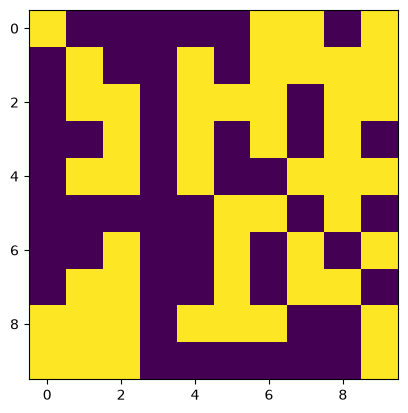

In [71]:
size = (10,10) 
J = np.prod(size) 
hid_layer = 10 
layers = [(2,hid_layer),(hid_layer,2)] 
params = gen_params(1,2*hid_layer+hid_layer*2) 
grid = init_grid(size=size) 
grid_ = grid.clone() 
grid__ = grid.clone() 
plt.imshow(grid)
print(grid.sum())

TRAINING
│
├── Initialize hyperparameters
│   ├── epochs = 75
│   ├── lr = 0.0001
│   ├── num_iter = 3
│   ├── replay_size = 50
│   ├── batch_size = 10
│   └── gamma = 0.9
│
├── Initialize replay memory
│   └── replay = deque(maxlen=50)
│
├── Initialize loss storage
│   └── losses[j] for each agent
│
│
└── for epoch in range(epochs):                 ← OUTER LOOP
    │
    ├── Initialize temporary values
    │   ├── act_means = zeros(J, 2)
    │   └── q_next = zeros(J)
    │
    │
    ├── for m in range(num_iter):               ← MEAN-FIELD ITERATION
    │   │
    │   └── for j in range(J):                   ← EACH AGENT
    │       │
    │       ├── Calculate mean action
    │       │   └── action_mean = mean_action(grid_, j)
    │       │
    │       ├── Store mean action
    │       │   └── act_means[j] = action_mean
    │       │
    │       ├── Calculate Q-values
    │       │   └── qvals = qfunc(action_mean, params)
    │       │
    │       ├── Select action using policy
    │       │   └── action = softmax_policy(qvals)
    │       │
    │       ├── Put action into grid
    │       │   └── grid__[coords(j)] = action
    │       │
    │       └── Store max Q-value
    │           └── q_next[j] = max(qvals)
                    grid_ = grid__
    │
    │
    ├── Update environment/grid
    │   ├── 
    │   └── grid = grid_
    │
    │
    ├── Convert grid → agent states
    │   └── actions[j] = get_substate(grid[j])
    │
    │
    ├── Calculate rewards
    │   └── rewards[j] = get_reward_2d(
    │                       actions[j],
    │                       act_means[j]
    │                   )
    │
    │
    ├── Create experience
    │   └── exp = (
    │           actions,
    │           rewards,
    │           act_means,
    │           q_next
    │       )
    │
    ├── Store experience
    │   └── replay.append(exp)
    │
    │
    ├── Experience Replay
    │   │
    │   ├── shuffle(replay)
    │   │
    │   └── if len(replay) > batch_size:
    │       │
    │       ├── Randomly select 10 experiences
    │       │   └── exps = random samples from replay
    │       │
    │       └── for j in range(J):              ← EACH AGENT
    │           │
    │           ├── Extract batch for agent j
    │           │   ├── jacts
    │           │   ├── jrewards
    │           │   ├── jmeans
    │           │   └── vs
    │           │
    │           ├── Calculate current Q-values
    │           │   └── qvals = Q(jmeans)
    │           │
    │           ├── Create target
    │           │   └── target = qvals.clone()
    │           │
    │           ├── Replace Q-value for chosen action
    │           │   └── target[action] =
    │           │          reward + gamma * next_Q
    │           │
    │           ├── Calculate loss
    │           │   └── loss = Σ(Q - target)²
    │           │
    │           ├── Store loss
    │           │   └── losses[j].append(loss)
    │           │
    │           ├── Backpropagation
    │           │   └── loss.backward()
    │           │
    │           └── Gradient descent
    │               └── params =
    │                      params - lr * params.grad
    │
    └── END epoch

In [72]:
from random import shuffle

epochs = 75
lr = 0.0001
num_iter = 3
replay_size = 50
batch_size = 10
gamma = 0.9

replay = deque(maxlen=50)

losses = [[] for _ in range(J)]

In [73]:
for epoch in range(epochs):

    for i in range(num_iter):
        act_means = torch.zeros((J,2))
        q_next = torch.zeros(J)
        # loop for 3 times to stablize the grid
        for j in range(J):
            # loop for all the elements in the grid
            # store the new action/state in a new grid
            x, y = coords(grid, j)
            act_mean = mean_action(grid_,j)
            act_means[j] = act_mean
            q_val = qfunc(act_mean,params[0],layers)
            action = softmax_policy(q_val)
            grid__[y][x] = action

            q_next[j] = torch.max(q_val) # ?
        grid_ = grid__.clone()
    grid = grid_.clone() 

    action_batch = torch.stack([substate(a.item()) for a in grid.flatten()])
    reward_batch = torch.stack([get_reward_2D(action_batch[j],act_means[j]) for j in range(J)])

    exp = (action_batch,reward_batch,act_means,q_next)
    replay.append(exp)
    shuffle(replay)

    if len(replay) > batch_size:
        idx = torch.randint(0,len(replay),(batch_size,))
        exps = [replay[ind] for ind in idx]
        for j in range(J):
            jacts = torch.stack([exp[0][j] for exp in exps],dim=0).detach()
            jrewards = torch.stack([exp[1][j] for exp in exps],dim=0).detach()
            jact_means = torch.stack([exp[2][j] for exp in exps],dim=0).detach()
            vs = torch.stack([exp[3][j] for exp in exps],dim=0).detach()
            q_vals = torch.stack([qfunc(jact_means[h],params[0],layers) for h in range(batch_size)])

            target = q_vals.clone().detach()
            target[torch.arange(batch_size),torch.argmax(jacts,dim=1)] = jrewards + gamma * vs

            loss = torch.sum(torch.pow(q_vals - target.detach(),2))
            losses[j].append(loss.detach())
            loss.backward()
            with torch.no_grad():
                params[0] -= lr * params[0].grad
            params[0].requires_grad = True

            
            


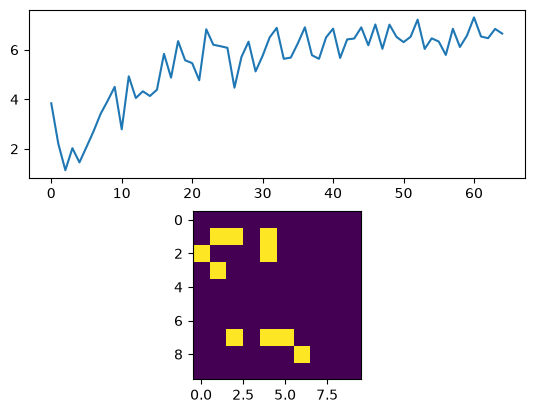

In [74]:
fig, ax = plt.subplots(2,1)
ax[0].plot(np.array(losses).mean(axis=0))
ax[1].imshow(grid)

# Battle

(np.float64(-0.5), np.float64(159.5), np.float64(175.5), np.float64(-0.5))

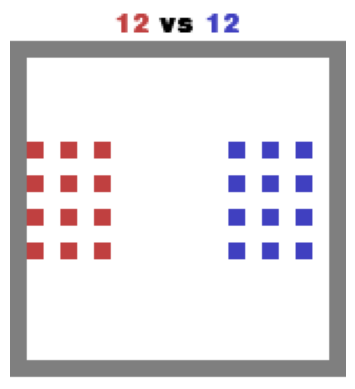

In [75]:
import math
from scipy.spatial.distance import cityblock

from magent2.environments import battle_v4

env = battle_v4.env(map_size=20, render_mode="rgb_array")
env.reset()

frame = env.render()
plt.imshow(frame)
plt.axis('off')

In [76]:
# hid_layer = 25
# in_size = 359
# act_space = 21
# layers = [(in_size,hid_layer),(hid_layer,act_space)]
# params = gen_params(2,in_size*hid_layer+hid_layer*act_space)
# map_size = 30
# width = height = map_size
# n1 = n2 = 16 # number of agent for each team
# gap = 1
# epoches = 100
# replay_size = 70
# batch_size = 25

# side1 = int(math.sqrt(n1)) * 2
# pos1 = []




agents: 60, in_size=359, act=21


(np.float64(-0.5), np.float64(239.5), np.float64(255.5), np.float64(-0.5))

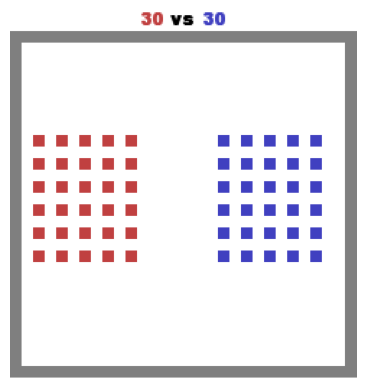

In [77]:

import numpy as np
from magent2.environments import battle_v4


env = battle_v4.env(
    map_size=30,
    max_cycles=1000,
    render_mode="rgb_array",
)
env.reset(seed=0)

sample_agent = env.agents[0]

act_space = env.action_space(sample_agent).n          # 21
in_size = 13 * 13 * 2 + act_space  # 338 + 21 = 359
hid_layer = 25
layers = [(in_size,hid_layer),(hid_layer,act_space)]

params = gen_params(2, in_size*hid_layer + hid_layer*act_space)

map_size = 30
width = height = map_size

epochs = 100
replay_size = 70
batch_size = 25

print(f"agents: {len(env.agents)}, in_size={in_size}, act={act_space}")
plt.imshow(env.render())
plt.axis('off')

In [78]:
pos_array_team1 = env.unwrapped.env.get_pos(env.unwrapped.env.get_handles()[0])
pos_array_team2 = env.unwrapped.env.get_pos(env.unwrapped.env.get_handles()[1])

In [79]:
def get_neighbers(j,pos_list,r=6):
    neighbors = []
    pos_j = pos_list[j]

    for i,pos_i in enumerate(pos_list):
        if i == j: continue
        dis = np.abs(pos_i,pos_j).sum()
        if dis < r:
            neighbors.append(i)

    return neighbors

In [80]:
get_neighbers(5,pos_array_team1)

[]

In [81]:
def get_onehot(a:int,l=21) -> torch.Tensor:
    x = torch.zeros(l)
    x[a] = 1
    return x

def get_scalar(x:torch.Tensor) -> int:
    return torch.argmax(x)

In [82]:
def get_mean_field(j,pos_list,act_list,r=6,l=21):
    neighbors = get_neighbers(j,pos_list,r)

    mean_field = torch.zeros(l)

    for k in neighbors:
        act_vec = get_onehot(act_list[k])
        mean_field += act_vec
    tot = mean_field.sum()
    if tot > 0:
        mean_field /= tot 
    return mean_field

act_list = torch.randint(0,21,(30,))
get_mean_field(2,pos_array_team1,act_list)

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [83]:
def act_choose(obs,param,layers,pos_list,acts,act_space=21,num_iter=5,temp=0.5):
    """
    obs:        观察张量，shape = N × 13 × 13 × 2，N 为存活 agent 数。
    mean_fields: 所有 agent 的平均场动作张量，shape = N × 21。
    pos_list:   各 agent 的位置列表，由 env.get_pos(...) 返回。
    acts:       各 agent 的整数动作向量，shape = (N,)。
    num_iter:   动作采样与策略更新交替进行的轮数。
    temp:       softmax 策略温度，控制探索率。
    """

    N = acts.shape[0]
    mean_fields = torch.zeros(N,act_space)
    acts_ = acts.clone()
    qvals = torch.zeros(N,act_space)

    for _ in range(num_iter):
        for j in range(N):
            mean_fields[j] = get_mean_field(j,pos_list,acts_)

        for j in range(N):
            state = torch.cat((obs[j].flatten().detach(),mean_fields[j]))
            qval = qfunc(state.detach(),param,layers)
            qvals[j,:] = qval[:]
            acts_[j] = softmax_policy(qvals[j],temp)

    return acts_, mean_fields, qvals

# def init()

In [84]:

def train(batch_size,replay,param,layers,J=64,gamma=0.5,lr=0.001):
    ids = torch.randint(0,len(replay),(batch_size,))
    exps = [replay[i] for i in ids]
    losses = []

    jobs = torch.stack([exp[0] for exp in exps]).detach()
    jacts = torch.stack([exp[1] for exp in exps]).detach()
    jrewards = torch.stack([exp[2] for exp in exps]).detach()
    jmeanfield = torch.stack([exp[3] for exp in exps]).detach()
    vs = torch.stack([exp[4] for exp in exps]).detach()
    qs = []

    for h in range(batch_size):
        state = torch.cat([jobs[h].flatten() ,jmeanfield[h]])
        qs.append(qfunc(state.detach(),param,layers))

    qvals = torch.stack(qs)
    target = qvals.clone().detach()

    target[torch.arange(batch_size),jacts] = jrewards + gamma * torch.max(vs,dim=1)[0]

    loss = torch.sum(torch.pow((target.detach()-qvals),2))
    losses.append(loss.detach().item())
    loss.backward()

    with torch.no_grad():
        param -= lr * param.grad
    param.requires_grad = True

    return np.array(losses).mean()


In [85]:
def init_mean_field(N,act_space=21):  
    mean_fields = torch.abs(torch.rand(N,act_space)) 

    for i in range(mean_fields.shape[0]):  
        mean_fields[i] = mean_fields[i] / mean_fields[i].sum() 
        
    return mean_fields

In [86]:
# 读取底层 magent 环境（PettingZoo wrapper 之下的 C++ core）
raw = env.unwrapped.env
# 拿到两队的 handle，后续所有按队操作都要传对应的 handle
h_red, h_blue = raw.get_handles()



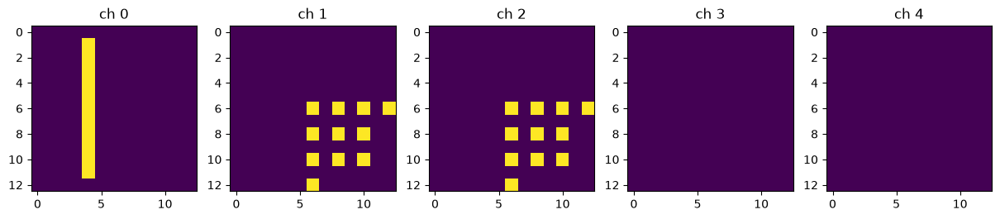

In [87]:
obs = raw.get_observation(h_red)
view = obs[0]
fig, axes = plt.subplots(1, view.shape[-1], figsize=(15, 3))
for c in range(view.shape[-1]):
    axes[c].imshow(view[0, :, :, c])   # 第 0 个 agent 的第 c 个通道
    axes[c].set_title(f'ch {c}')
plt.show()


In [88]:
red_pos  = raw.get_pos(h_red)
blue_pos = raw.get_pos(h_blue)

print("red 0 pos:", red_pos[0])
print("all red positions relative to red[0]:")
print(red_pos - red_pos[0])       # 队友的相对位置
print("all blue positions relative to red[0]:")
print(blue_pos - red_pos[0])      # 敌人的相对位置


red 0 pos: [2 9]
all red positions relative to red[0]:
[[ 0  0]
 [ 0  2]
 [ 0  4]
 [ 0  6]
 [ 0  8]
 [ 0 10]
 [ 2  0]
 [ 2  2]
 [ 2  4]
 [ 2  6]
 [ 2  8]
 [ 2 10]
 [ 4  0]
 [ 4  2]
 [ 4  4]
 [ 4  6]
 [ 4  8]
 [ 4 10]
 [ 6  0]
 [ 6  2]
 [ 6  4]
 [ 6  6]
 [ 6  8]
 [ 6 10]
 [ 8  0]
 [ 8  2]
 [ 8  4]
 [ 8  6]
 [ 8  8]
 [ 8 10]]
all blue positions relative to red[0]:
[[16  0]
 [16  2]
 [16  4]
 [16  6]
 [16  8]
 [16 10]
 [18  0]
 [18  2]
 [18  4]
 [18  6]
 [18  8]
 [18 10]
 [20  0]
 [20  2]
 [20  4]
 [20  6]
 [20  8]
 [20 10]
 [22  0]
 [22  2]
 [22  4]
 [22  6]
 [22  8]
 [22 10]
 [24  0]
 [24  2]
 [24  4]
 [24  6]
 [24  8]
 [24 10]]


In [89]:

# 当前存活 agent 数量：get_pos 返回的位置数组长度 = 活着的 agent 数
# 注意 N1/N2 每步都可能变（agent 会死），本 cell 只做 epoch 开头的快照
N1 = len(raw.get_pos(h_red))
N2 = len(raw.get_pos(h_blue))
step_ct = 0                   # 当前 epoch 内步数计数

# 首步动作随机初始化——后续 act_choose 的 num_iter 轮迭代会把它覆盖掉
acts_1 = torch.randint(low=0, high=act_space, size=(N1,))
acts_2 = torch.randint(low=0, high=act_space, size=(N2,))

# 经验回放缓冲，两队各一份；容量满后 deque 自动丢最老的
replay1 = deque(maxlen=replay_size)
replay2 = deque(maxlen=replay_size)

# 下一状态的 max Q 值缓存；训练目标 target = reward + gamma * qnext
qnext1 = torch.zeros(N1)
qnext2 = torch.zeros(N2)

# 平均场初值取均匀分布（1/act_space），代表"对邻居动作一无所知"
# 之后每一步会由邻居真实动作重新估计
act_means1 = torch.ones((N1, act_space)) / act_space
act_means2 = torch.ones((N2, act_space)) / act_space

# 单步奖励缓存，从 env.rewards 里按 agent 顺序读进来
rewards1 = torch.zeros(N1)
rewards2 = torch.zeros(N2)

# 训练损失历史，画曲线用
losses1 = []
losses2 = []


In [90]:
obs_full = raw.get_observation(h_red)
print(obs_full[0].shape)  

(30, 13, 13, 5)


In [91]:
# # 批量设动作
# acts = np.random.randint(0, 21, size=(len(raw.get_pos(h_red)),), dtype=np.int32)
# raw.set_action(h_red, acts)         # AttributeError?

# # 无参 step 推进一整帧
# done = raw.step()                    # AttributeError?

# # 批量拿 reward
# rewards = raw.get_reward(h_red)      # AttributeError?

# # 清死人
# raw.clear_dead()                     # AttributeError?


In [92]:
def team_step(team,param,acts,layers):
    obs = raw.get_observation(team) # 5 channels , 1 3
    ids = raw.get_agent_id(team)
    obs = torch.from_numpy(obs[0][:,:,:,[1,3]])
    agents_pos = raw.get_pos(team)
    
    acts, act_means, qvals = act_choose(obs,param,layers,agents_pos,acts)

    return acts, act_means, qvals, obs, ids


In [93]:
def add_to_replay(replay,obs,acts,rewards,act_means,qnext):
    J = acts.shape[0]

    for j in range(J):
        exp = (obs[j], acts[j], rewards[j], act_means[j], qnext[j])
        replay.append(exp)

    return replay

In [94]:
# result = raw.step()
# print(type(result), result)


In [95]:
# ============ 主训练循环 ============
# 结构：epoch → step（while not done）→ 每 step 做：
#   1. 两队各自 team_step 拿动作
#   2. 提交动作到 env，raw.step() 推进一帧
#   3. 再 team_step 一次拿 next-state 的 Q 值（用作 bootstrap 目标）
#   4. 收集 reward、把经验塞进 replay
#   5. 清死人、按稳定 id 收缩 acts
#   6. replay 够大就训练一步（更新 params[0] / params[1]）

frames = []
map_size = 30

# ---- 验证 params 是否真的在更新 ----
# 训练前记录 sum 和内存 id，训练后再对比
p0_sum_before = params[0].sum().item()
p1_sum_before = params[1].sum().item()
p0_id_before  = id(params[0])
p1_id_before  = id(params[1])
print(f"[BEFORE] params[0] sum={p0_sum_before:.4f}  id={p0_id_before}")
print(f"[BEFORE] params[1] sum={p1_sum_before:.4f}  id={p1_id_before}")

for i in range(epochs):
    done = False
    step_ct = 0
    # 注意：不 env.reset()，跟书上一样让局面接着上一 epoch 打
    # 如果需要每 epoch 重开，取消下一行注释，并把 N1/N2/acts_1/acts_2 也重初始化
    # env.reset()

    while not done:
        # === 1. 两队分别决策（team_step 里做 num_iter 轮 mean-field 迭代）===
        acts_1, act_means1, qvals1, obs_1, ids_1 = \
            team_step(h_red, params[0], acts_1, layers)
        raw.set_action(h_red, acts_1.detach().numpy().astype(np.int32))

        acts_2, act_means2, qvals2, obs_2, ids_2 = \
            team_step(h_blue, params[1], acts_2, layers)
        raw.set_action(h_blue, acts_2.detach().numpy().astype(np.int32))

        # === 2. 推进环境一帧 ===
        done = raw.step()

        # === 3. 再算一次 team_step 拿 next-state Q（用于 Q-learning bootstrap）===
        # 这里 acts_1/acts_2 传的是已执行的动作，只为给 mean-field 迭代提供初值；
        # 返回的第 0 个 acts 会被丢掉，只留 qnext（qvals）
        _, _, qnext1, _, ids_1 = team_step(h_red,  params[0], acts_1, layers)
        _, _, qnext2, _, ids_2 = team_step(h_blue, params[1], acts_2, layers)

        # === 4. 从 raw 拿 minimap 转 RGB 存帧 ===
        # ch 0 = team1(red)，ch 1 = team2(blue)；> 0 视为该格有 agent
        mm = raw.get_global_minimap(map_size, map_size)
        canvas = np.zeros((map_size, map_size, 3), dtype=np.uint8)
        canvas[..., 0] = (mm[..., 0] > 0).astype(np.uint8) * 255
        canvas[..., 2] = (mm[..., 1] > 0).astype(np.uint8) * 255
        frames.append(canvas)

        # === 5. 拿 reward，塞 replay ===
        rewards1 = torch.from_numpy(raw.get_reward(h_red)).float()
        rewards2 = torch.from_numpy(raw.get_reward(h_blue)).float()

        replay1 = add_to_replay(replay1, obs_1, acts_1, rewards1, act_means1, qnext1)
        replay2 = add_to_replay(replay2, obs_2, acts_2, rewards2, act_means2, qnext2)

        # === 6. 处理死人：先记 (数组 index, 稳定 id) 快照，clear 后按 id 反查活着的 index ===
        ids_1_ = list(zip(np.arange(ids_1.shape[0]), ids_1))
        ids_2_ = list(zip(np.arange(ids_2.shape[0]), ids_2))

        raw.clear_dead()

        ids_1 = raw.get_agent_id(h_red)       # 清后的稳定 id 列表（只剩活的）
        ids_2 = raw.get_agent_id(h_blue)

        ids_1_ = [i for (i, j) in ids_1_ if j in ids_1]   # 幸存者在旧数组里的 index
        ids_2_ = [i for (i, j) in ids_2_ if j in ids_2]

        acts_1 = acts_1[ids_1_]               # 收缩 acts，长度与新 N 对齐
        acts_2 = acts_2[ids_2_]

        # === 7. 训练：replay 够大就跑一步 ===
        # train 里 `param -= lr * param.grad` 是 in-place（.sub_），
        # 会改到 params[0] / params[1] 本身；用下面的 before/after 验证
        if len(replay1) > batch_size and len(replay2) > batch_size:
            loss1 = train(batch_size, replay1, params[0], layers, N1)
            loss2 = train(batch_size, replay2, params[1], layers, N2)
            losses1.append(loss1)
            losses2.append(loss2)

        step_ct += 1
        if step_ct > 250:                     # 单局步数上限，避免死磕
            break

    # 每 epoch 打印进度（选：只打前 5 个和每 10 个，避免刷屏）
    if i < 5 or i % 10 == 0:
        p0_now = params[0].sum().item()
        p1_now = params[1].sum().item()
        print(f"[epoch {i:3d}] step_ct={step_ct}, "
              f"red_alive={len(raw.get_pos(h_red))}, blue_alive={len(raw.get_pos(h_blue))}, "
              f"p0_sum={p0_now:.2f} (Δ={p0_now-p0_sum_before:+.2f}), "
              f"p1_sum={p1_now:.2f} (Δ={p1_now-p1_sum_before:+.2f})")

# ---- 训练结束后验证 params 确实变了 ----
p0_sum_after = params[0].sum().item()
p1_sum_after = params[1].sum().item()
print()
print(f"[AFTER]  params[0] sum={p0_sum_after:.4f}  id={id(params[0])}")
print(f"[AFTER]  params[1] sum={p1_sum_after:.4f}  id={id(params[1])}")
print(f"Δp0 = {p0_sum_after - p0_sum_before:+.4f}   id 是否相同: {id(params[0]) == p0_id_before}")
print(f"Δp1 = {p1_sum_after - p1_sum_before:+.4f}   id 是否相同: {id(params[1]) == p1_id_before}")
print()
print("解读：")
print("  - Δ 非零 → params 值确实被更新（train 生效）")
print("  - id 相同 → 参数对象没被 rebind，是 in-place 改的（`-=` 语义）")
print("  - 两条都满足才是‘真正在训练’")

[BEFORE] params[0] sum=-4.7248  id=130230327046992
[BEFORE] params[1] sum=11.0480  id=130230327046224
[epoch   0] step_ct=251, red_alive=30, blue_alive=30, p0_sum=-208.74 (Δ=-204.02), p1_sum=-269.43 (Δ=-280.48)
[epoch   1] step_ct=251, red_alive=30, blue_alive=30, p0_sum=-27.59 (Δ=-22.87), p1_sum=-320.77 (Δ=-331.82)
[epoch   2] step_ct=251, red_alive=30, blue_alive=30, p0_sum=-339.84 (Δ=-335.12), p1_sum=-258.66 (Δ=-269.71)
[epoch   3] step_ct=251, red_alive=30, blue_alive=27, p0_sum=-788.85 (Δ=-784.13), p1_sum=-249.33 (Δ=-260.38)
[epoch   4] step_ct=251, red_alive=30, blue_alive=24, p0_sum=-1337.84 (Δ=-1333.11), p1_sum=-210.16 (Δ=-221.21)
[epoch  10] step_ct=156, red_alive=27, blue_alive=0, p0_sum=-3985.85 (Δ=-3981.12), p1_sum=146.02 (Δ=+134.97)
[epoch  20] step_ct=1, red_alive=27, blue_alive=0, p0_sum=-4003.81 (Δ=-3999.09), p1_sum=148.53 (Δ=+137.48)
[epoch  30] step_ct=1, red_alive=27, blue_alive=0, p0_sum=-4021.78 (Δ=-4017.05), p1_sum=151.05 (Δ=+140.00)
[epoch  40] step_ct=1, red_ali

In [96]:
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML

fig, ax = plt.subplots(figsize=(6, 6))
im = ax.imshow(frames[0])
ax.axis('off')

def update(i):
    im.set_data(frames[i])
    return [im]

anim = animation.FuncAnimation(fig, update, frames=len(frames), interval=100, blit=True)
plt.close()
HTML(anim.to_jshtml())

In [97]:
def bad_update(x):
    print("  inside before:", id(x))
    x = x + 1                              # rebind 到新对象
    print("  inside after: ", id(x))
    return

y = torch.tensor([1.0, 2.0])
print("outside before:", id(y), y)
bad_update(y)
print("outside after: ", id(y), y)


outside before: 130228652165200 tensor([1., 2.])
  inside before: 130228652165200
  inside after:  130228583328848
outside after:  130228652165200 tensor([1., 2.])


In [98]:
print("params[0] sum after: ", params[0].sum().item())
print("params[0] id:        ", id(params[0]))


params[0] sum after:  -4145.7265625
params[0] id:         130230327046992
